# Rolling regression

In [1]:
import os
import warnings

import arviz as az
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
import pandas as pd
import pymc as pm
import xarray as xr
import pytensor
import zarr

from matplotlib import MatplotlibDeprecationWarning

warnings.filterwarnings(action="ignore", category=MatplotlibDeprecationWarning)

In [2]:
%%html
<style> table { font-variant-numeric: tabular-nums; } </style>

In [3]:
RANDOM_SEED = 8927
rng = np.random.default_rng(RANDOM_SEED)
%config InlineBackend.figure_format = 'retina'
az.style.use("arviz-white")
#az.style.use("arviz-viridish")

## Data set

In [64]:
# from pandas_datareader import data
# prices = data.GoogleDailyReader(symbols=['GLD', 'GFI'], end='2014-8-1').read().loc['Open', :, :]
try:
    prices = pd.read_csv(os.path.join("..", "data", "stock_prices.csv")).dropna()
except FileNotFoundError:
    prices = pd.read_csv(pm.get_data("stock_prices.csv")).dropna()

prices["Date"] = pd.DatetimeIndex(prices["Date"])
prices = prices.set_index("Date")
prices_zscored = (prices - prices.mean()) / prices.std()
prices

,GFI,GLD
Date,,
2010-01-04,13.55,109.82
2010-01-05,13.51,109.88
2010-01-06,13.70,110.71
2010-01-07,13.63,111.07
2010-01-08,13.72,111.52
...,...,...
2014-07-28,4.02,125.44
2014-07-29,4.09,125.79
2014-07-30,4.00,124.89


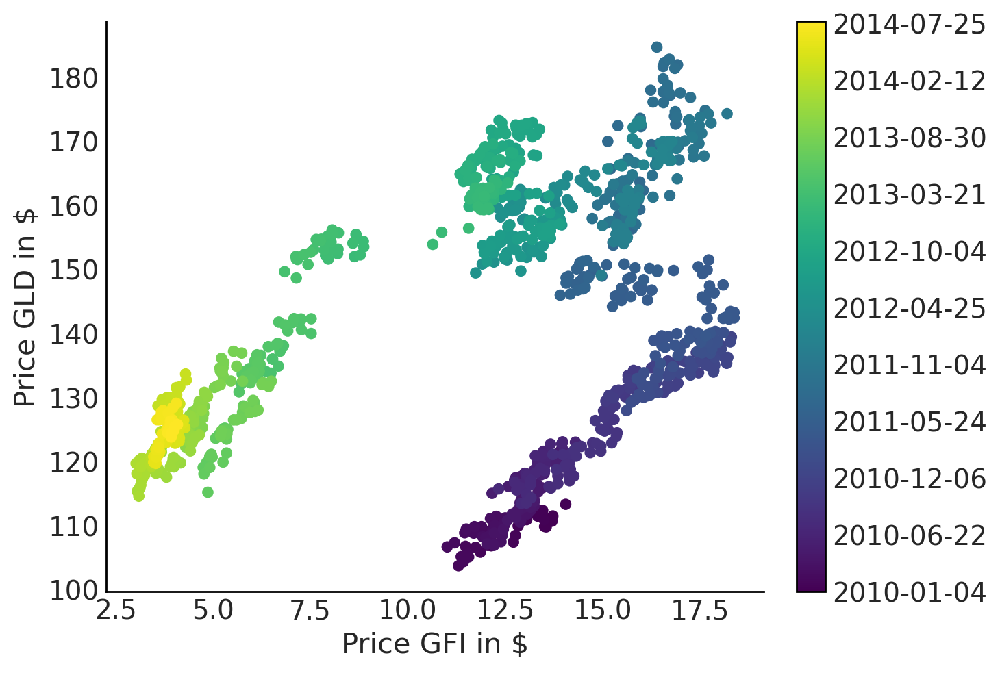

In [5]:
fig = plt.figure()
ax = fig.add_subplot(111, xlabel=r"Price GFI in \$", ylabel=r"Price GLD in \$")
colors = np.linspace(0, 1, len(prices))
mymap = plt.get_cmap("viridis")
sc = ax.scatter(prices.GFI, prices.GLD, c=colors, cmap=mymap, lw=0)
ticks = colors[:: len(prices) // 10]
ticklabels = [str(p.date()) for p in prices[:: len(prices) // 10].index]
cb = plt.colorbar(sc, ticks=ticks)
cb.ax.set_yticklabels(ticklabels);

## Vanilla single-variable linear regression

In [6]:
with pm.Model() as simple_model:  # model specifications in PyMC are wrapped in a with-statement
    # Define priors
    sigma = pm.HalfCauchy("sigma", beta=10)
    intercept = pm.Normal("Intercept", 0, sigma=20)
    slope = pm.Normal("slope", 0, sigma=20)

    # Define likelihood
    likelihood = pm.Normal("y", mu=intercept + slope * prices_zscored.GFI.to_numpy(), sigma=sigma, observed=prices_zscored.GLD.to_numpy())

    # Inference!
    # draw 3000 posterior samples using NUTS sampling
    idata = pm.sample(3000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, Intercept, slope]


Sampling 4 chains for 1_000 tune and 3_000 draw iterations (4_000 + 12_000 draws total) took 1 seconds.


In [7]:
idata.to_zarr('idata.zarr') ;

In [8]:
idata = az.from_zarr('idata.zarr')

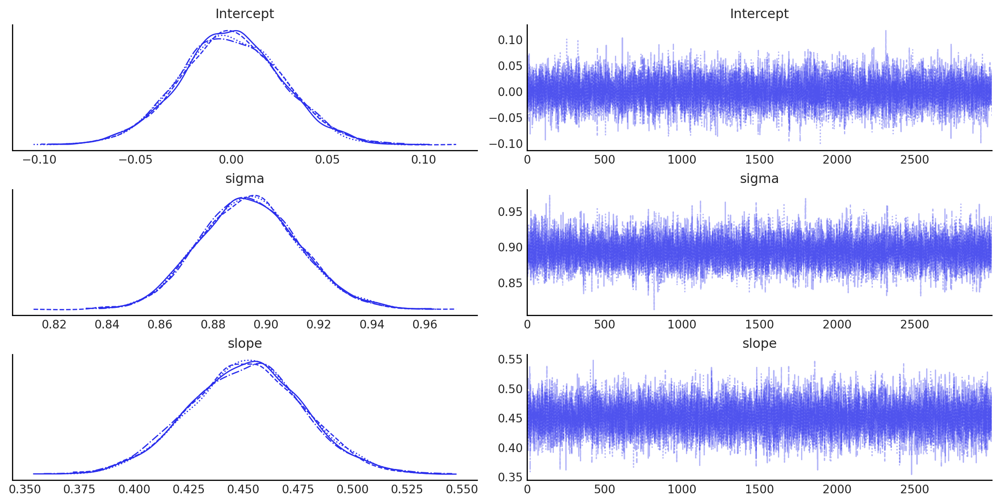

In [9]:
az.plot_trace(idata);

In [10]:
az.summary(idata)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,-0.000,0.027,-0.051,0.049,0.0,0.0,17753.0,8730.0,1.0
sigma,0.894,0.019,0.859,0.930,0.0,0.0,17938.0,9940.0,1.0
slope,0.451,0.026,0.403,0.502,0.0,0.0,18507.0,9855.0,1.0


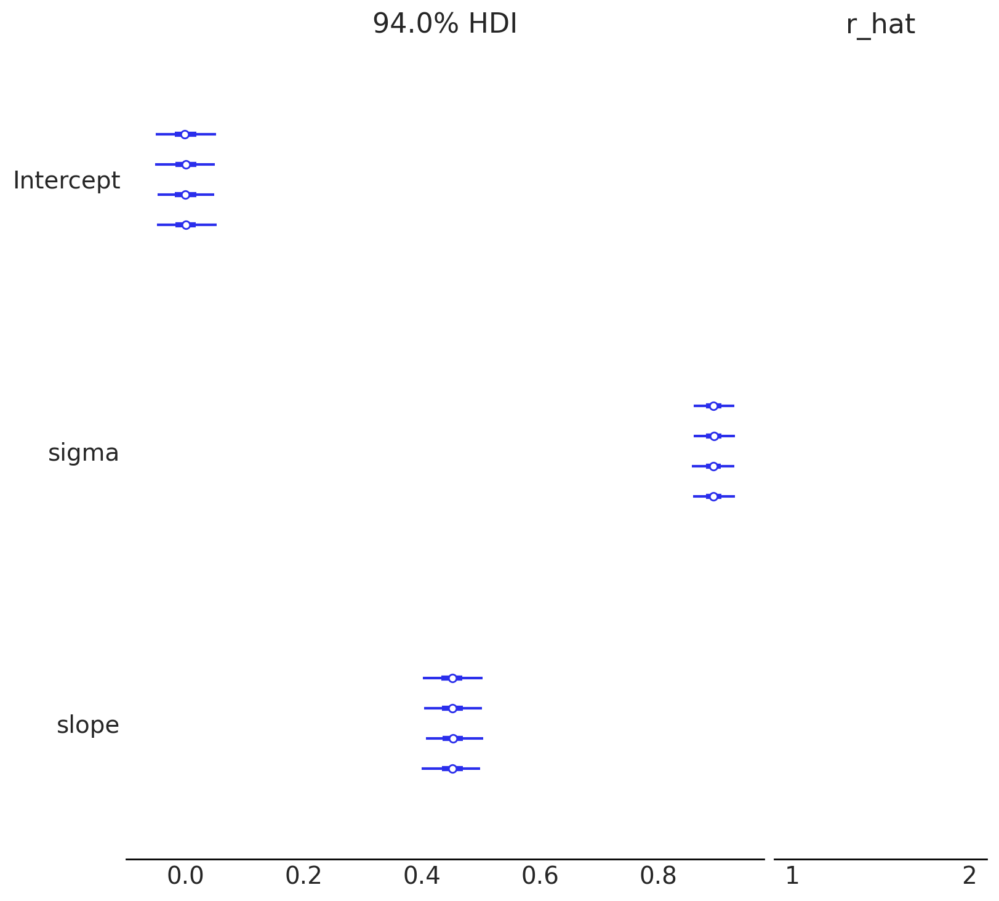

In [11]:
az.plot_forest(idata, r_hat=True);

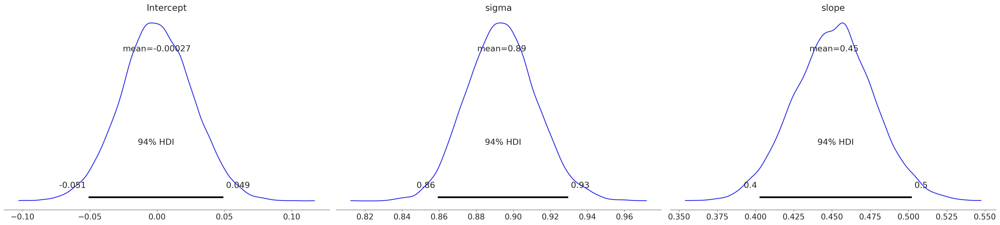

In [12]:
az.plot_posterior(idata);

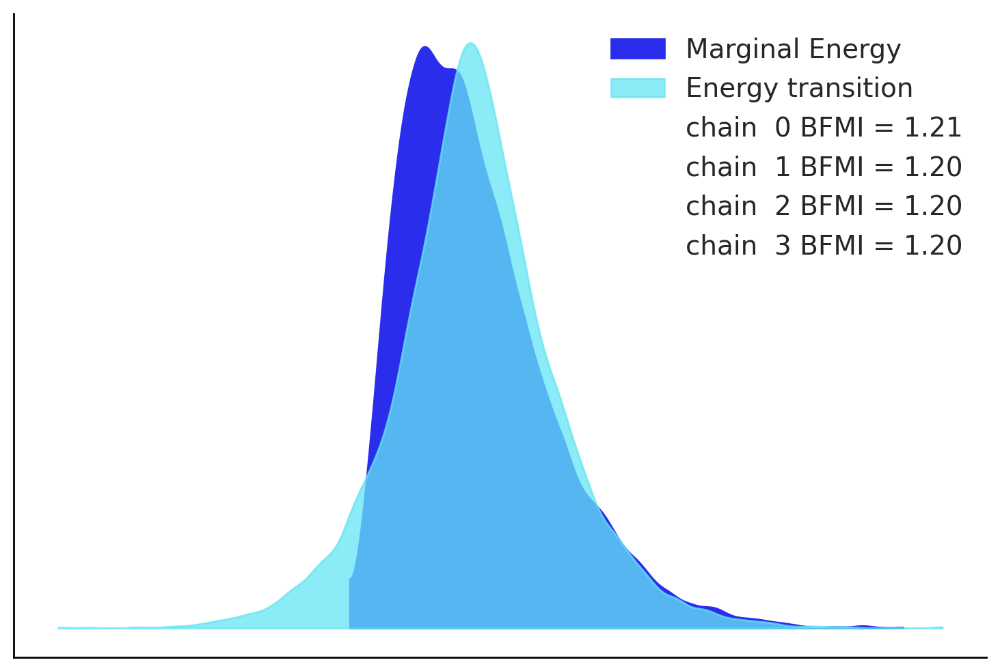

In [13]:
az.plot_energy(idata);

## Single-variable linear regressinon, keeping sampled values of mu

In [14]:
with pm.Model() as model_mu:  # model specifications in PyMC are wrapped in a with-statement
    # Define priors
    sigma = pm.HalfCauchy("sigma", beta=10)
    alpha = pm.Normal("alpha", mu=0, sigma=20)
    beta = pm.Normal("beta", mu=0, sigma=20)

    mu = pm.Deterministic("mu", alpha + beta * prices_zscored.GFI.to_numpy())

    # Define likelihood
    likelihood = pm.Normal("y", mu=mu, sigma=sigma, observed=prices_zscored.GLD.to_numpy())

    # Inference
    # trace_reg = pm.sample(tune=2000)
    idata_mu = pm.sample(tune=2000)    

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, alpha, beta]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 1 seconds.


In [15]:
idata_mu.to_zarr('idata_mu.zarr') ;

In [16]:
idata_mu = az.from_zarr('idata_mu.zarr')

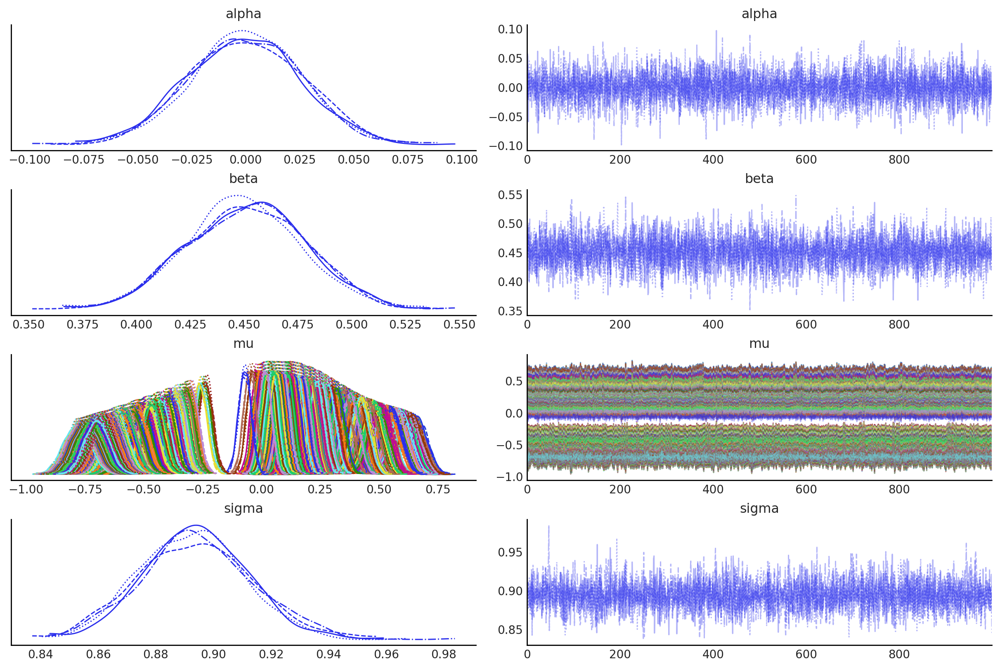

In [17]:
az.plot_trace(idata_mu);

In [18]:
az.summary(idata_mu)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,-0.000,0.026,-0.047,0.049,0.000,0.0,6199.0,3093.0,1.0
beta,0.451,0.027,0.403,0.504,0.000,0.0,6201.0,3261.0,1.0
mu[0],0.204,0.028,0.154,0.261,0.000,0.0,5869.0,3515.0,1.0
mu[1],0.200,0.028,0.146,0.253,0.000,0.0,5868.0,3459.0,1.0
mu[2],0.218,0.029,0.164,0.273,0.000,0.0,5876.0,3514.0,1.0
...,...,...,...,...,...,...,...,...,...
mu[1132],-0.682,0.049,-0.771,-0.586,0.001,0.0,6416.0,3207.0,1.0
mu[1133],-0.691,0.050,-0.780,-0.593,0.001,0.0,6410.0,3207.0,1.0
mu[1134],-0.697,0.050,-0.788,-0.600,0.001,0.0,6401.0,3207.0,1.0
mu[1135],-0.696,0.050,-0.787,-0.599,0.001,0.0,6402.0,3207.0,1.0


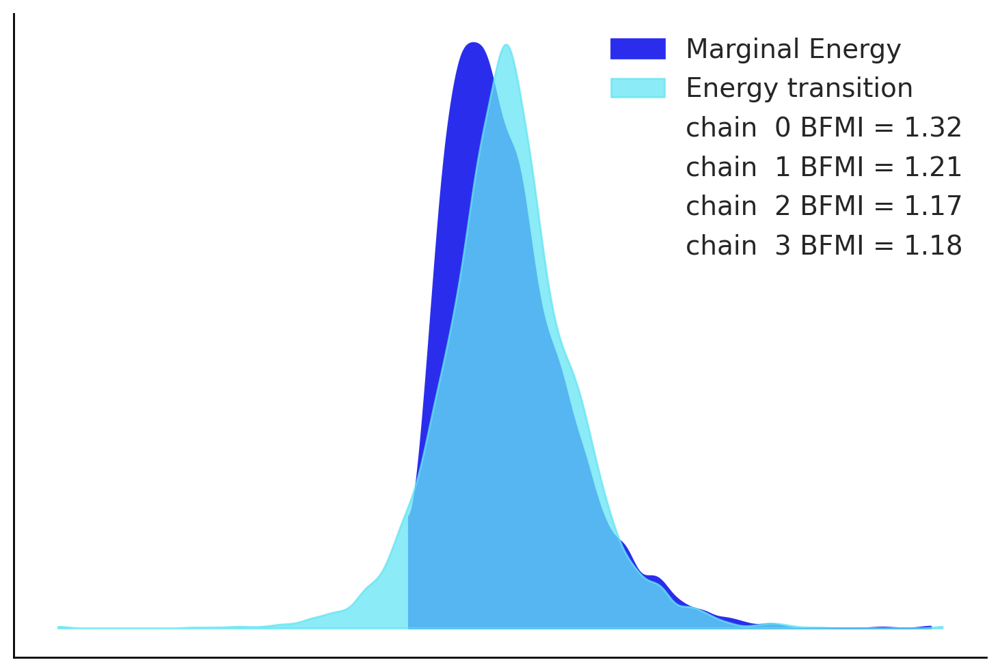

In [19]:
az.plot_energy(idata_mu);

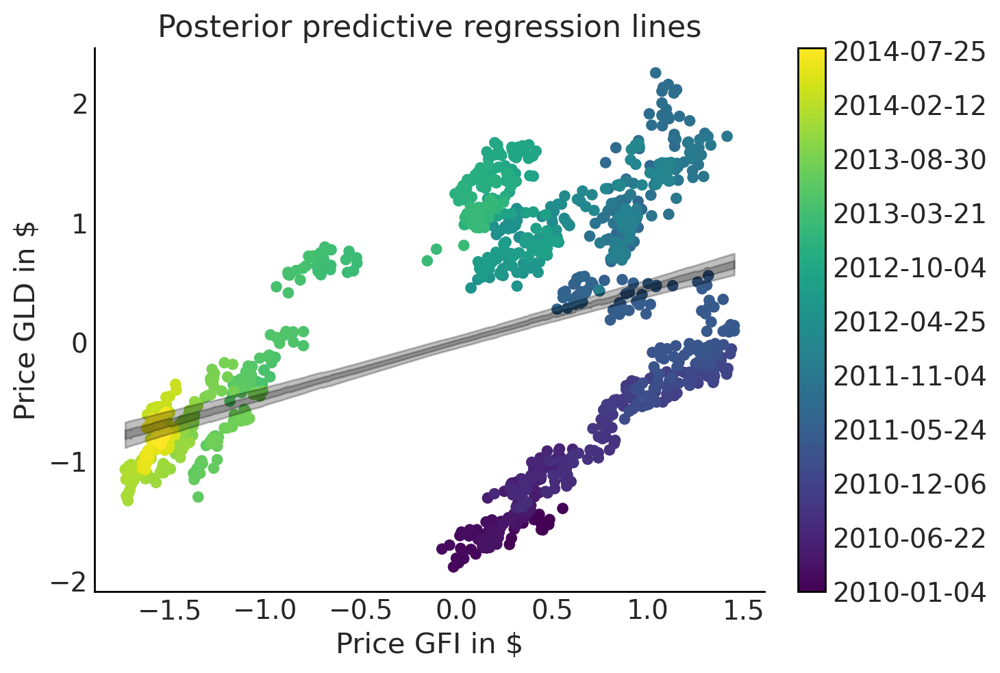

In [20]:
fig = plt.figure()
ax = fig.add_subplot(
    111,
    xlabel=r"Price GFI in \$",
    ylabel=r"Price GLD in \$",
    title="Posterior predictive regression lines",
)
sc = ax.scatter(prices_zscored.GFI, prices_zscored.GLD, c=colors, cmap=mymap, lw=0)

xi = xr.DataArray(prices_zscored.GFI.values)
az.plot_hdi(
    xi,
    idata_mu.posterior.mu,
    color="k",
    hdi_prob=0.95,
    ax=ax,
    fill_kwargs={"alpha": 0.25},
    smooth=False,
)
az.plot_hdi(
    xi,
    idata_mu.posterior.mu,
    color="k",
    hdi_prob=0.5,
    ax=ax,
    fill_kwargs={"alpha": 0.25},
    smooth=False,
)

cb = plt.colorbar(sc, ticks=ticks)
cb.ax.set_yticklabels(ticklabels);

## Rolling single-variable regression

In [21]:
with pm.Model(coords={"time": prices.index.values}) as model_randomwalk:
    # std of random walk
    sigma_alpha = pm.Exponential("sigma_alpha", 50.0)
    sigma_beta = pm.Exponential("sigma_beta", 50.0)

    alpha = pm.GaussianRandomWalk(
        "alpha", sigma=sigma_alpha, init_dist=pm.Normal.dist(0, 10), dims="time"
    )
    beta = pm.GaussianRandomWalk(
        "beta", sigma=sigma_beta, init_dist=pm.Normal.dist(0, 10), dims="time"
    )

In [22]:
with model_randomwalk:
    # Define regression
    regression = alpha + beta * prices_zscored.GFI.values

    # Assume prices are Normally distributed, the mean comes from the regression.
    sd = pm.HalfNormal("sd", sigma=0.1)
    likelihood = pm.Normal("y", mu=regression, sigma=sd, observed=prices_zscored.GLD.to_numpy())

In [23]:
with model_randomwalk:
    idata_randomwalk = pm.sample(tune=2000, target_accept=0.9)
#    trace_rw = pm.sample(tune=2000, target_accept=0.9)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma_alpha, sigma_beta, alpha, beta, sd]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 292 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 1 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


In [24]:
idata_randomwalk.to_zarr('idata_randomwalk.zarr') ;

In [25]:
idata_randomwalk = az.from_zarr('idata_randomwalk.zarr')

We cannot plot the many many alpha and beta values here:

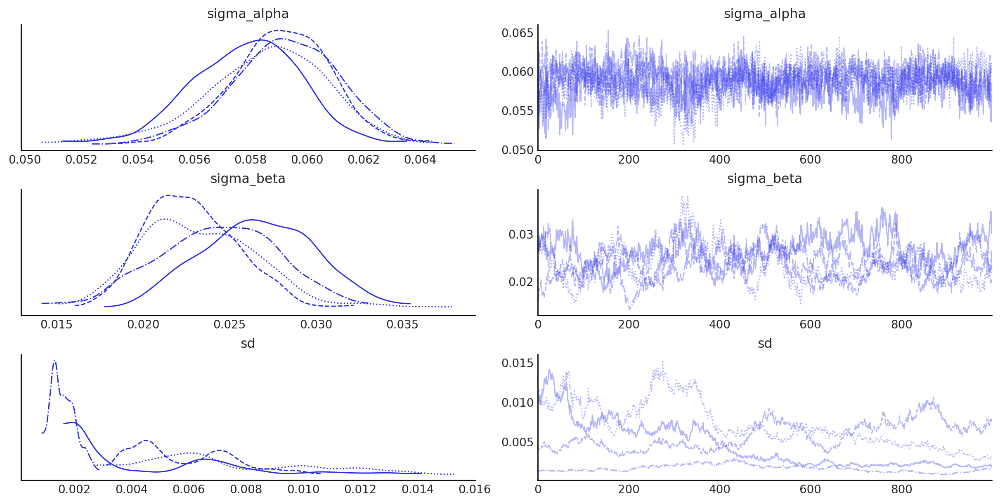

In [26]:
az.plot_trace(idata_randomwalk, var_names=['sigma_alpha', 'sigma_beta', 'sd']);

In [27]:
az.summary(idata_randomwalk)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha[2010-01-04T00:00:00.000000000],-1.900,0.065,-2.014,-1.771,0.005,0.004,145.0,300.0,1.02
alpha[2010-01-05T00:00:00.000000000],-1.891,0.063,-2.009,-1.772,0.005,0.004,141.0,308.0,1.02
alpha[2010-01-06T00:00:00.000000000],-1.878,0.067,-2.001,-1.749,0.006,0.004,136.0,315.0,1.03
alpha[2010-01-07T00:00:00.000000000],-1.850,0.064,-1.964,-1.725,0.006,0.004,134.0,254.0,1.02
alpha[2010-01-08T00:00:00.000000000],-1.840,0.065,-1.961,-1.713,0.006,0.004,129.0,294.0,1.03
...,...,...,...,...,...,...,...,...,...
beta[2014-07-31T00:00:00.000000000],1.649,0.235,1.251,2.147,0.077,0.057,10.0,36.0,1.35
beta[2014-08-01T00:00:00.000000000],1.643,0.236,1.219,2.119,0.077,0.057,10.0,35.0,1.34
sd,0.005,0.003,0.001,0.010,0.001,0.001,5.0,15.0,2.30
sigma_alpha,0.059,0.002,0.055,0.063,0.000,0.000,56.0,181.0,1.08


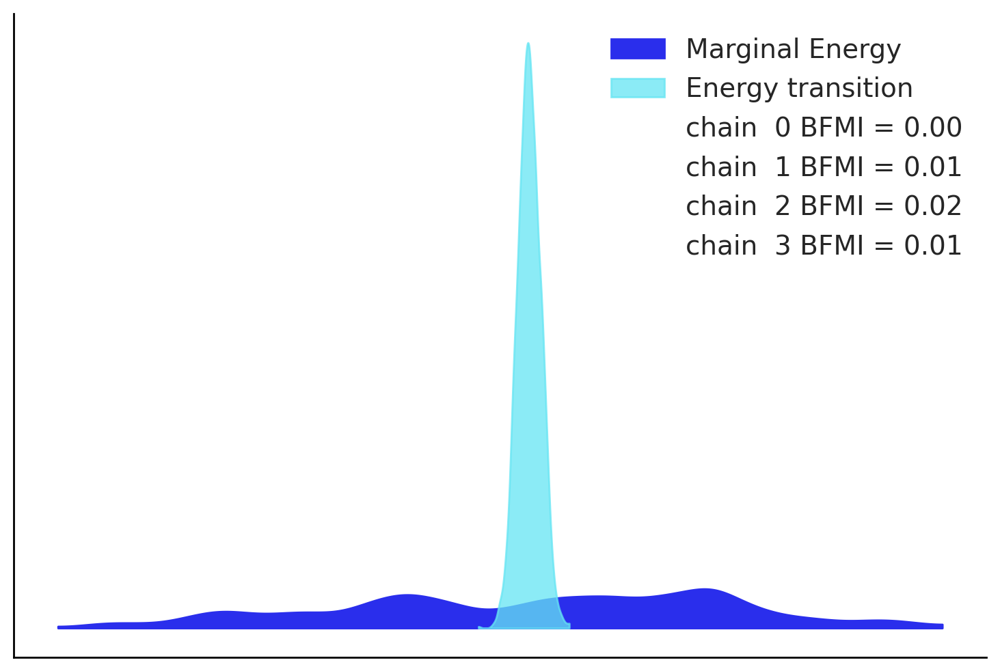

In [28]:
az.plot_energy(idata_randomwalk);

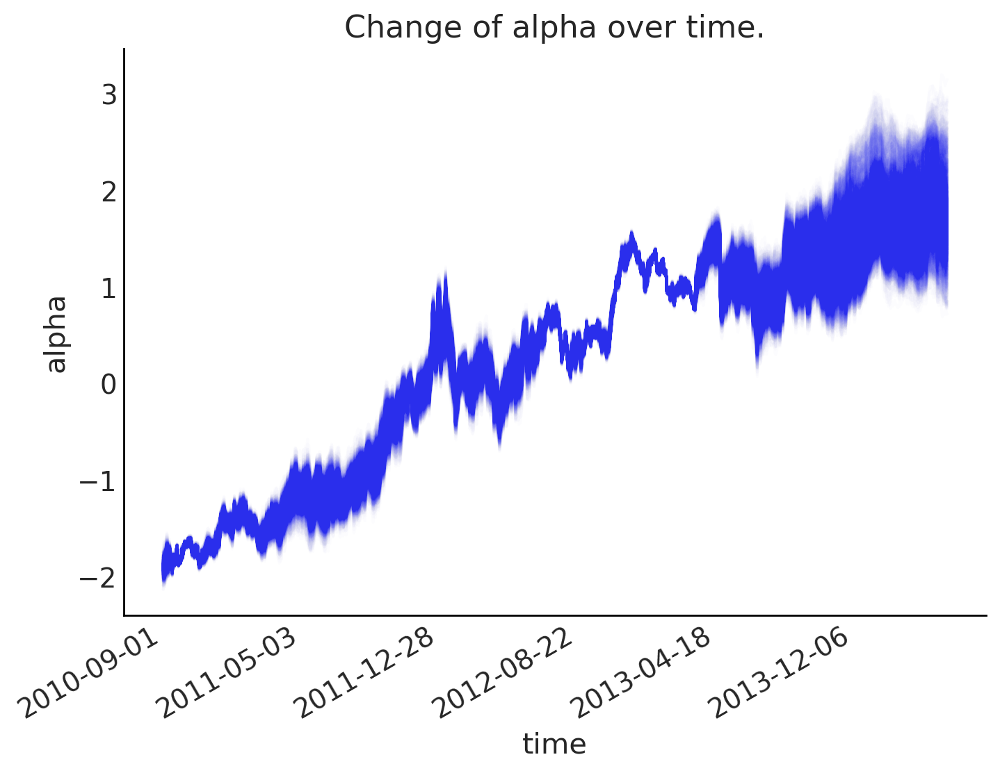

In [29]:
fig = plt.figure(figsize=(8, 6), constrained_layout=False)
ax = plt.subplot(111, xlabel="time", ylabel="alpha", title="Change of alpha over time.")
ax.plot(az.extract(idata_randomwalk, var_names="alpha"), "C0", alpha=0.01)

ticks_changes = mticker.FixedLocator(ax.get_xticks().tolist())
ticklabels_changes = [str(p.date()) for p in prices[:: len(prices) // 7].index]
ax.xaxis.set_major_locator(ticks_changes)
ax.set_xticklabels(ticklabels_changes)

fig.autofmt_xdate()

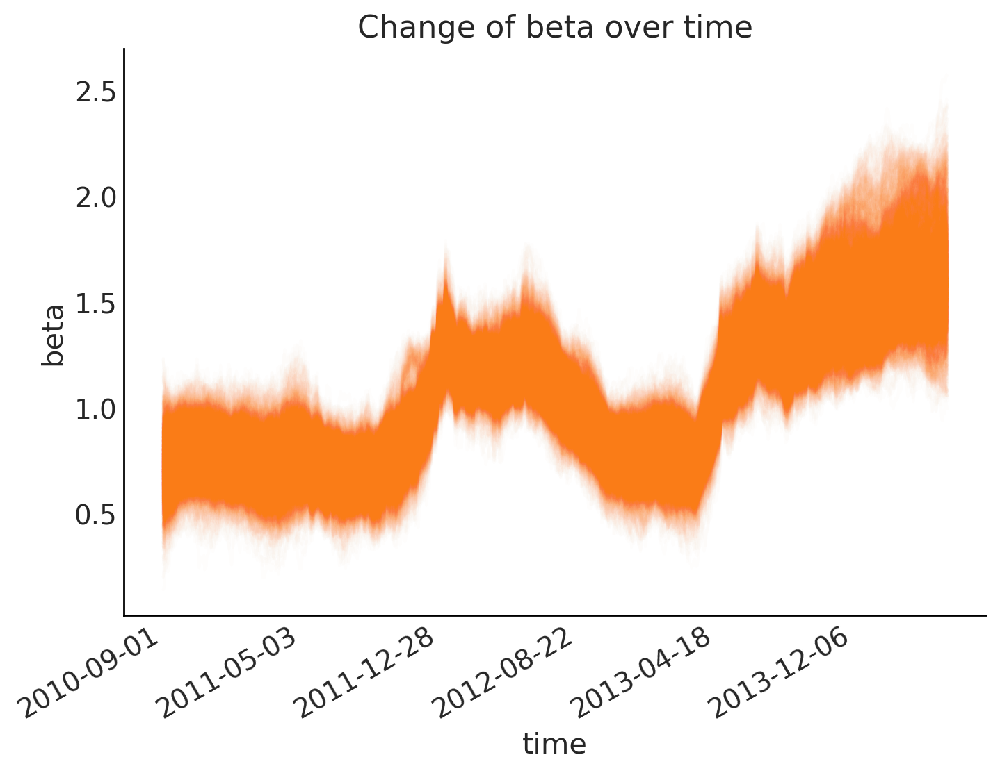

In [30]:
fig = plt.figure(figsize=(8, 6), constrained_layout=False)
ax = fig.add_subplot(111, xlabel="time", ylabel="beta", title="Change of beta over time")
ax.plot(az.extract(idata_randomwalk, var_names="beta"), "C1", alpha=0.01)

ax.xaxis.set_major_locator(ticks_changes)
ax.set_xticklabels(ticklabels_changes)

fig.autofmt_xdate()

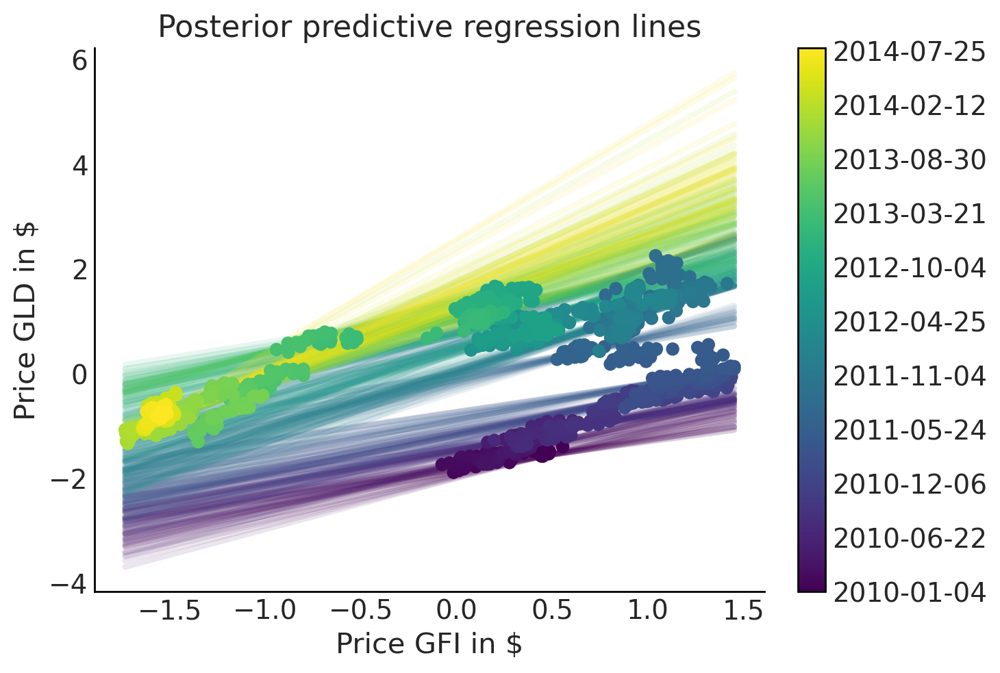

In [31]:
fig = plt.figure()
ax = fig.add_subplot(
    111,
    xlabel=r"Price GFI in \$",
    ylabel=r"Price GLD in \$",
    title="Posterior predictive regression lines",
)

colors = np.linspace(0, 1, len(prices))
colors_sc = np.linspace(0, 1, len(prices.index.values[::50]))

xi = xr.DataArray(np.linspace(prices_zscored.GFI.min(), prices_zscored.GFI.max(), 50))

for i, time in enumerate(prices.index.values[::50]):
    sel_trace = az.extract(idata_randomwalk).sel(time=time)
    regression_line = sel_trace["alpha"] + sel_trace["beta"] * xi
    ax.plot(
        xi,
        regression_line.T[:, 0::200],
        color=mymap(colors_sc[i]),
        alpha=0.1,
        zorder=10,
        linewidth=3,
    )

sc = ax.scatter(
    prices_zscored.GFI, prices_zscored.GLD, label="data", cmap=mymap, c=colors, zorder=11
)

cb = plt.colorbar(sc, ticks=ticks)
cb.ax.set_yticklabels(ticklabels);

## Rolling single-variable regressinon - expressed as multi-variable

Here both GFI, is specified as the `xvars` along with a constant that represents the intercept

In [32]:
yobs = prices_zscored['GLD'].values

p = 2
data = (prices_zscored.copy().drop(columns='GLD')
        .assign(Constant = 1)
       )

In [33]:
with pm.Model(coords={"time": data.index.values, 'xvars':data.columns.values}) as model_multi_randomwalk:
    X = pm.MutableData("X",data.values,dims=("time","xvars"))
    # std of random walk
    beta_sigma = pm.Exponential("beta_sigma", 50.0,dims='xvars')
    beta = pm.MvGaussianRandomWalk("beta", 
                                    mu=np.zeros(p),
                                    dims=("time","xvars"),
                                    cov=pytensor.tensor.diag(beta_sigma),
                                    init_dist=pm.MvNormal.dist(0, 10*np.eye(p)))

    # Define regression
    regression = pm.math.sum(X*beta, axis=1)

    # Assume prices are Normally distributed, the mean comes from the regression.
    sd = pm.HalfNormal("sd", sigma=0.1)

    likelihood = pm.Normal("y", mu=regression, sigma=sd, observed=yobs)

    idata_multi_randomwalk = pm.sample(tune=2000, target_accept=0.9)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta_sigma, beta, sd]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 4812 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 1 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


In [34]:
idata_multi_randomwalk.to_zarr('idata_multi_randomwalk.zarr') ;

In [35]:
idata_multi_randomwalk = az.from_zarr('idata_multi_randomwalk.zarr')
idata_multi_randomwalk

Inference data with groups:
	> posterior
	> sample_stats
	> observed_data
	> constant_data

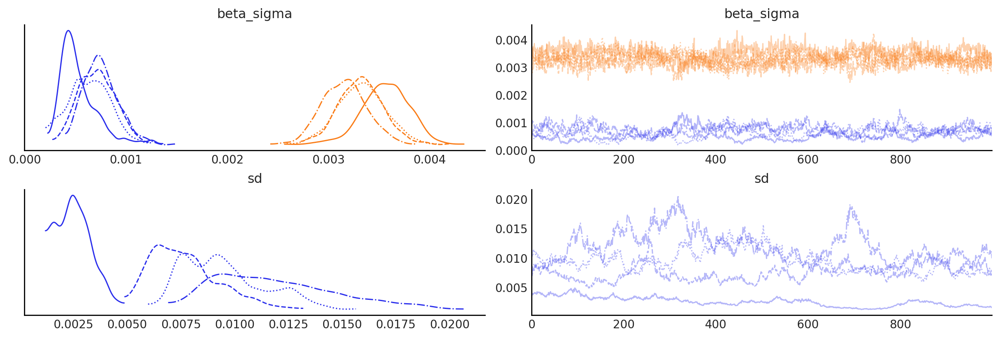

In [36]:
az.plot_trace(idata_multi_randomwalk, var_names=['beta_sigma', 'sd']);

In [37]:
az.summary(idata_multi_randomwalk)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"beta[2010-01-04T00:00:00.000000000, GFI]",0.699,0.162,0.404,1.012,0.015,0.011,115.0,279.0,1.06
"beta[2010-01-04T00:00:00.000000000, Constant]",-1.890,0.074,-2.027,-1.751,0.007,0.005,117.0,299.0,1.05
"beta[2010-01-05T00:00:00.000000000, GFI]",0.701,0.160,0.396,0.994,0.015,0.011,112.0,286.0,1.06
"beta[2010-01-05T00:00:00.000000000, Constant]",-1.881,0.072,-2.012,-1.745,0.007,0.005,113.0,253.0,1.06
"beta[2010-01-06T00:00:00.000000000, GFI]",0.703,0.157,0.413,1.007,0.015,0.011,111.0,235.0,1.06
...,...,...,...,...,...,...,...,...,...
"beta[2014-08-01T00:00:00.000000000, GFI]",1.728,0.277,1.254,2.267,0.072,0.052,15.0,57.0,1.23
"beta[2014-08-01T00:00:00.000000000, Constant]",1.847,0.428,1.135,2.699,0.111,0.081,15.0,56.0,1.23
beta_sigma[GFI],0.001,0.000,0.000,0.001,0.000,0.000,24.0,149.0,1.15
beta_sigma[Constant],0.003,0.000,0.003,0.004,0.000,0.000,14.0,67.0,1.21


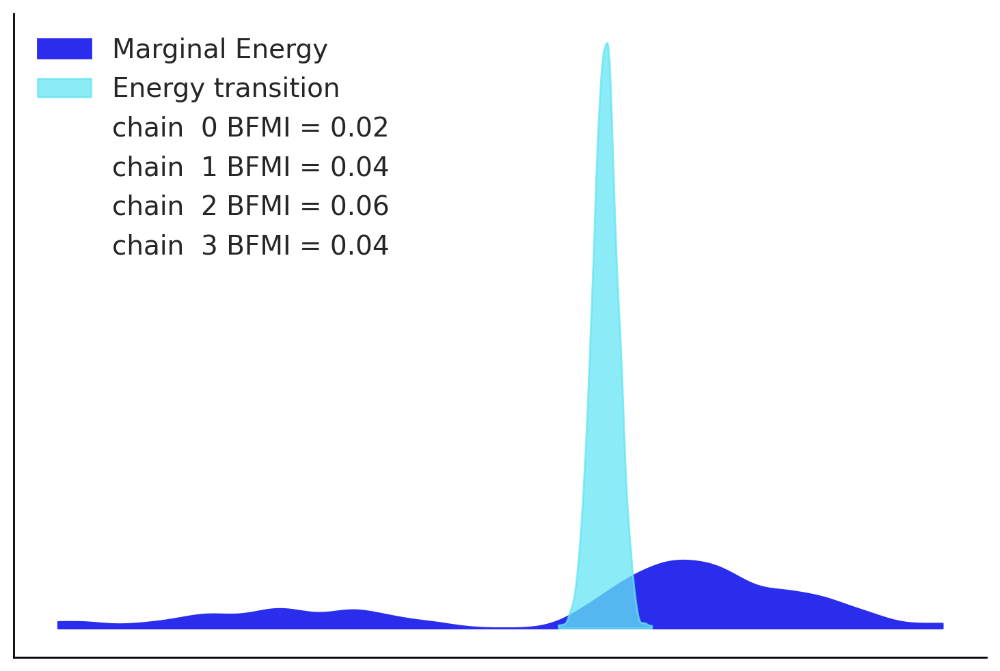

In [38]:
az.plot_energy(idata_multi_randomwalk);

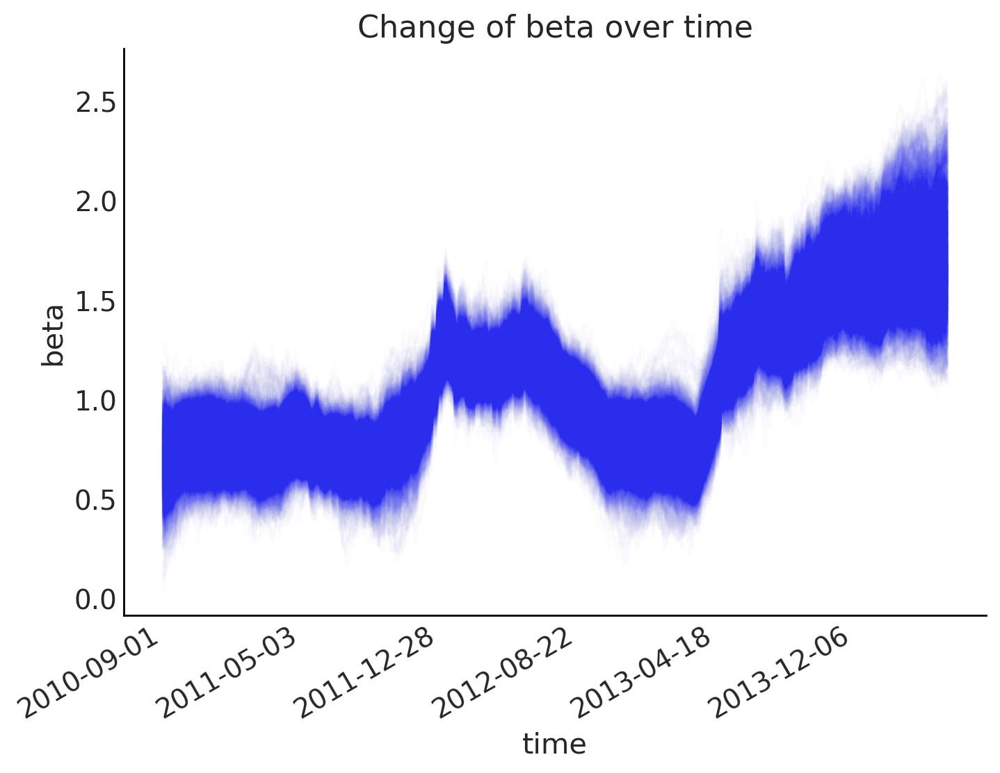

In [39]:
fig = plt.figure(figsize=(8, 6), constrained_layout=False)
ax = fig.add_subplot(111, xlabel="time", ylabel="beta", title="Change of beta over time")
ax.plot(az.extract(idata_multi_randomwalk, var_names="beta").loc[:, 'GFI'], "C0", alpha=0.01)

ticks_changes = mticker.FixedLocator(ax.get_xticks().tolist())
ticklabels_changes = [str(p.date()) for p in prices[:: len(prices) // 7].index]

ax.xaxis.set_major_locator(ticks_changes)
ax.set_xticklabels(ticklabels_changes)

fig.autofmt_xdate()

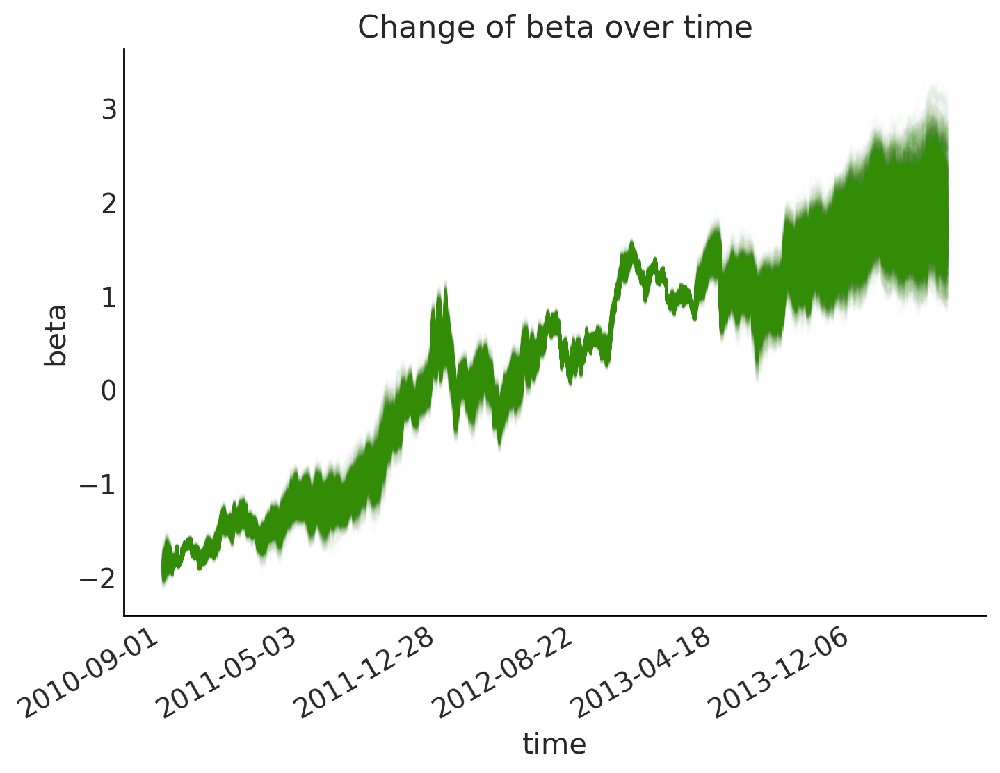

In [40]:
fig = plt.figure(figsize=(8, 6), constrained_layout=False)
ax = fig.add_subplot(111, xlabel="time", ylabel="beta", title="Change of beta over time")
ax.plot(az.extract(idata_multi_randomwalk, var_names="beta").loc[:, 'Constant'], "C2", alpha=0.01)

ax.xaxis.set_major_locator(ticks_changes)
ax.set_xticklabels(ticklabels_changes)

fig.autofmt_xdate()

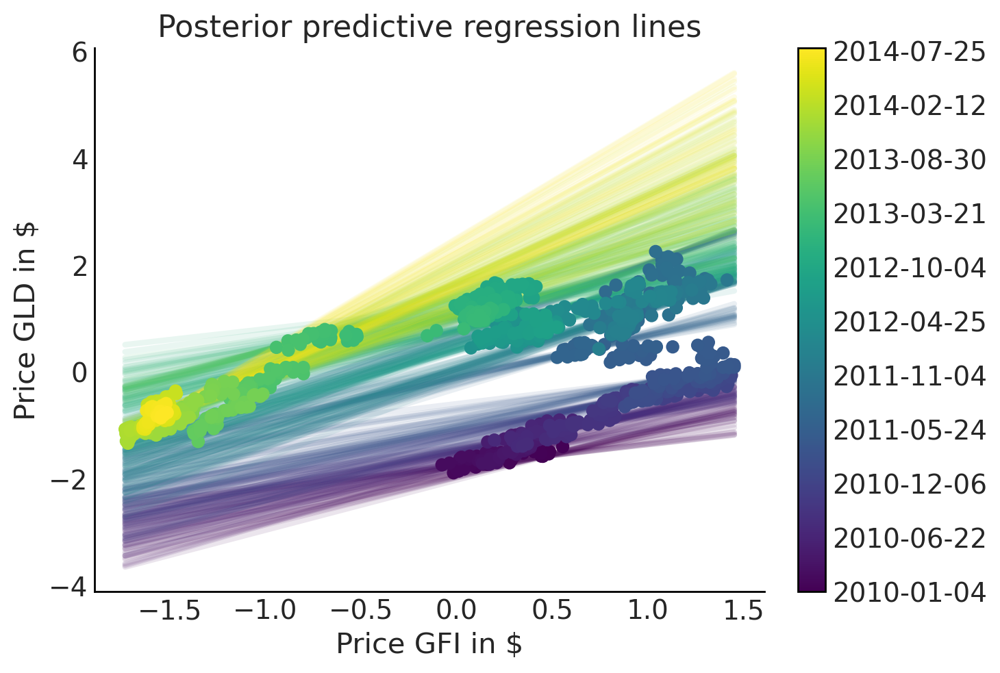

In [41]:
fig = plt.figure()
ax = fig.add_subplot(
    111,
    xlabel=r"Price GFI in \$",
    ylabel=r"Price GLD in \$",
    title="Posterior predictive regression lines",
)

colors = np.linspace(0, 1, len(prices))
colors_sc = np.linspace(0, 1, len(prices.index.values[::50]))

xi = xr.DataArray(np.linspace(prices_zscored.GFI.min(), prices_zscored.GFI.max(), 50))

for i, time in enumerate(prices.index.values[::50]):
    sel_trace = az.extract(idata_multi_randomwalk).sel(time=time)
    # regression_line = sel_trace["alpha"] + sel_trace["beta"] * xi
    regression_line = sel_trace["beta"][0] * xi + sel_trace["beta"][1]
    ax.plot(
        xi,
        regression_line.T[:, 0::200],
        color=mymap(colors_sc[i]),
        alpha=0.1,
        zorder=10,
        linewidth=3,
    )

sc = ax.scatter(
    prices_zscored.GFI, prices_zscored.GLD, label="data", cmap=mymap, c=colors, zorder=11
)

cb = plt.colorbar(sc, ticks=ticks)
cb.ax.set_yticklabels(ticklabels);

## Rolling multi-variable regressinon

Here both GFI, and additional FOO variable is specified as the `xvars`. This also represents the intercept is expressed as a constant.

In [42]:
yobs = prices_zscored['GLD'].values

# # some random missing values
# missing_idx = np.random.choice(np.arange(yobs.size), size=100)
# yobs[missing_idx] = np.nan
# # turn yobs into masked array
# yobs = np.ma.masked_values(yobs, value=np.nan)
# # T = len(yobs)

p = 3
data_with_foo = (prices_zscored.copy()
        .assign(FOO = lambda df: df.GLD + np.random.random(len(df.GLD)) / 2 )
        .assign(Constant = 1)
       )
data = data_with_foo.drop(columns='GLD')

# data.loc[data.GFI < -1.5, 'GFI'] = np.nan
# masked_gfi = np.ma.masked_values(data.GFI, value=np.nan)
# xdata = data.drop(columns='GFI').to_xarray()
# xdata['GFI'] = masked_gfi

In [43]:
with pm.Model(coords={"time": data.index.values, 'xvars':data.columns.values}) as model_randomwalk_foo:
    X = pm.MutableData("X",data.values,dims=("time","xvars"))
    # std of random walk
    beta_sigma = pm.Exponential("beta_sigma", 50.0,dims='xvars')
    beta = pm.MvGaussianRandomWalk("beta", 
                                    mu=np.zeros(p),
                                    dims=("time","xvars"),
                                    cov=pytensor.tensor.diag(beta_sigma),
                                    init_dist=pm.MvNormal.dist(0, 10*np.eye(p)))

    # Define regression
    regression = pm.math.sum(X*beta, axis=1)

    # Assume prices are Normally distributed, the mean comes from the regression.
    sd = pm.HalfNormal("sd", sigma=0.1)

    likelihood = pm.Normal("y", mu=regression, sigma=sd, observed=yobs)

    idata_randomwalk_foo = pm.sample(tune=2000, target_accept=0.9)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta_sigma, beta, sd]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 2030 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 1 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


In [44]:
idata_randomwalk_foo.to_zarr('idata_randomwalk_foo.zarr') ;

In [45]:
idata_randomwalk_foo = az.from_zarr('idata_randomwalk_foo.zarr')

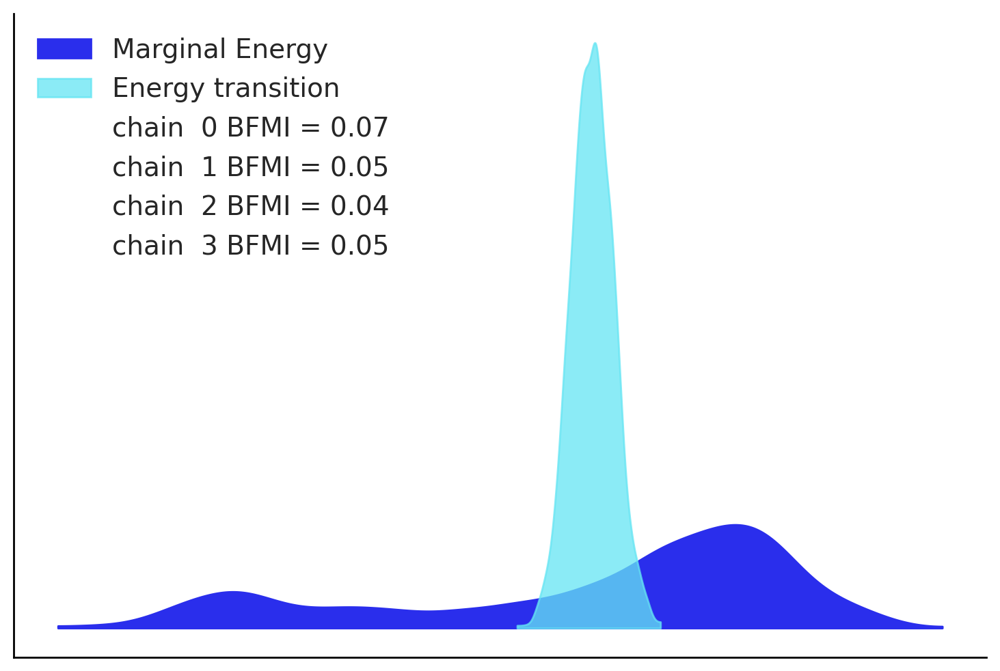

In [46]:
az.plot_energy(idata_randomwalk_foo);

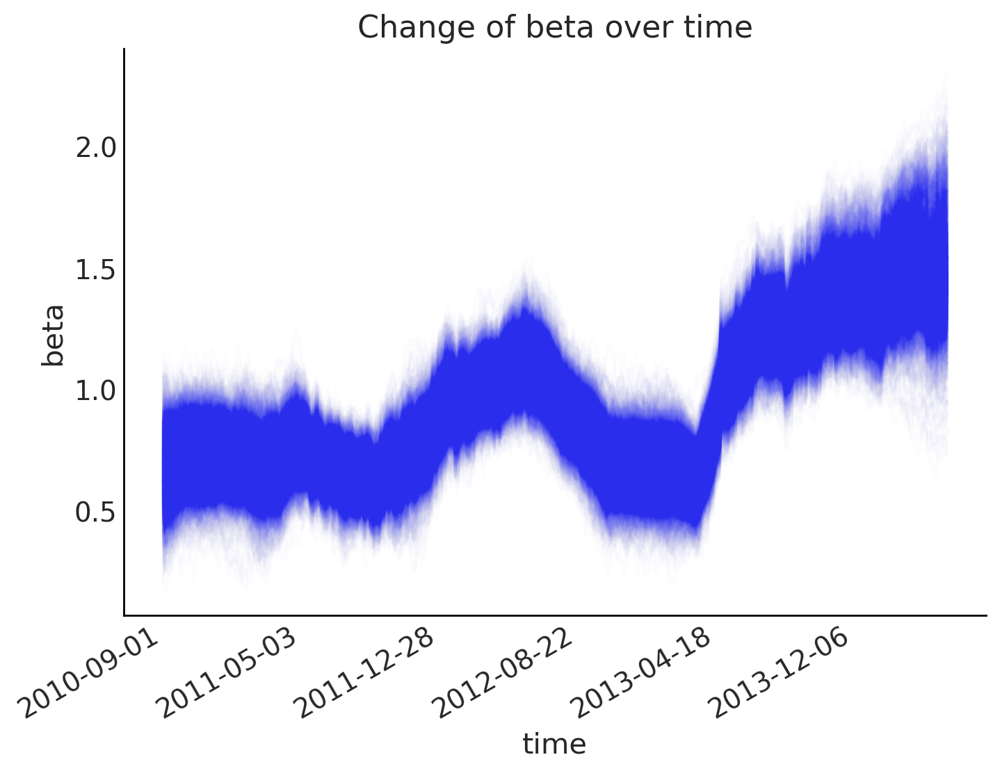

In [47]:
fig = plt.figure(figsize=(8, 6), constrained_layout=False)
ax = fig.add_subplot(111, xlabel="time", ylabel="beta", title="Change of beta over time")
ax.plot(az.extract(idata_randomwalk_foo, var_names="beta").loc[:, 'GFI'], "C0", alpha=0.01)

ticks_changes = mticker.FixedLocator(ax.get_xticks().tolist())
ticklabels_changes = [str(p.date()) for p in prices[:: len(prices) // 7].index]

ax.xaxis.set_major_locator(ticks_changes)
ax.set_xticklabels(ticklabels_changes)

fig.autofmt_xdate()

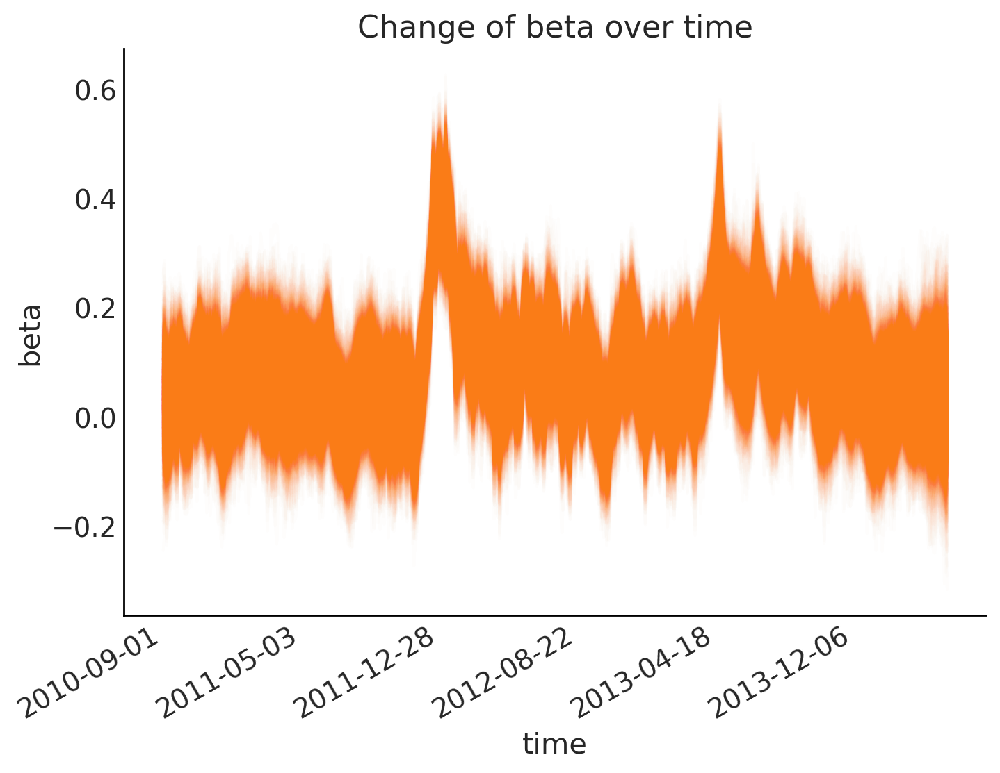

In [48]:
fig = plt.figure(figsize=(8, 6), constrained_layout=False)
ax = fig.add_subplot(111, xlabel="time", ylabel="beta", title="Change of beta over time")
ax.plot(az.extract(idata_randomwalk_foo, var_names="beta").loc[:, 'FOO'], "C1", alpha=0.01)

ax.xaxis.set_major_locator(ticks_changes)
ax.set_xticklabels(ticklabels_changes)

fig.autofmt_xdate()

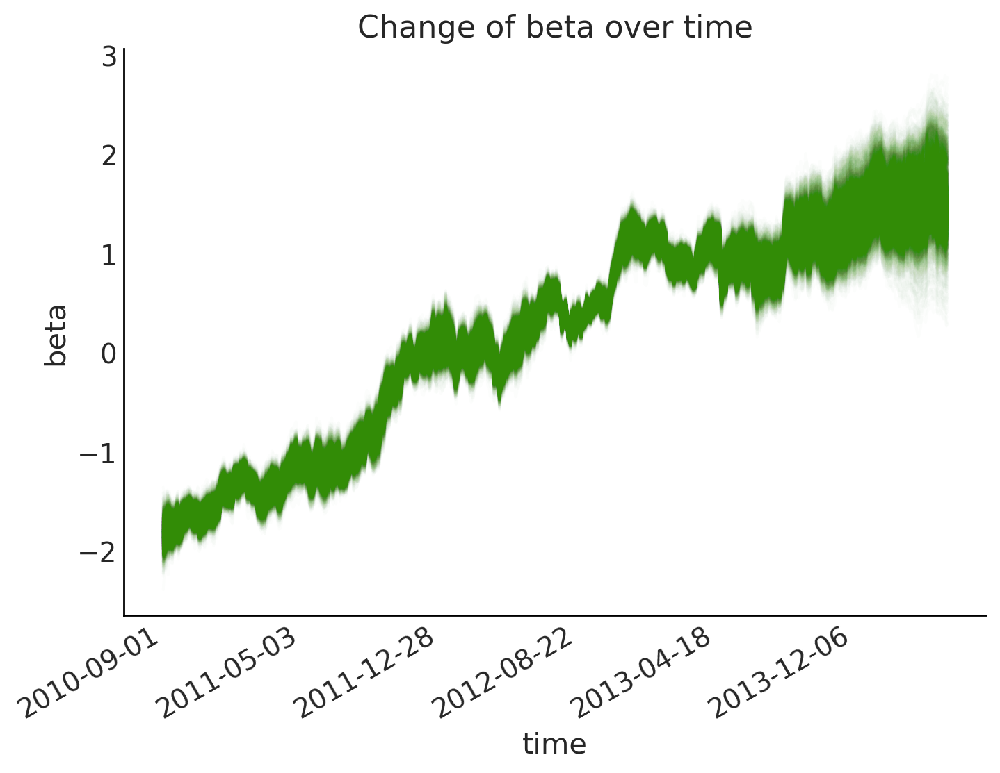

In [49]:
fig = plt.figure(figsize=(8, 6), constrained_layout=False)
ax = fig.add_subplot(111, xlabel="time", ylabel="beta", title="Change of beta over time")
ax.plot(az.extract(idata_randomwalk_foo, var_names="beta").loc[:, 'Constant'], "C2", alpha=0.01)

ax.xaxis.set_major_locator(ticks_changes)
ax.set_xticklabels(ticklabels_changes)

fig.autofmt_xdate()

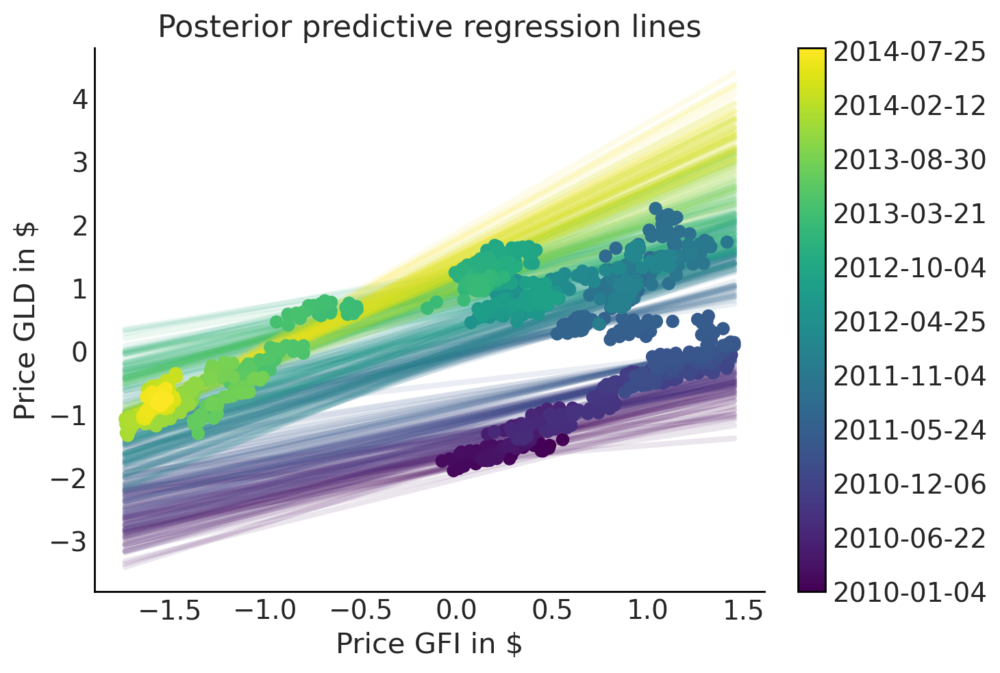

In [50]:
fig = plt.figure()
ax = fig.add_subplot(
    111,
    xlabel=r"Price GFI in \$",
    ylabel=r"Price GLD in \$",
    title="Posterior predictive regression lines",
)

colors = np.linspace(0, 1, len(prices))
colors_sc = np.linspace(0, 1, len(prices.index.values[::50]))

xi = xr.DataArray(np.linspace(prices_zscored.GFI.min(), prices_zscored.GFI.max(), 50))

for i, time in enumerate(prices.index.values[::50]):
    sel_trace = az.extract(idata_randomwalk_foo).sel(time=time)
    # regression_line = sel_trace["alpha"] + sel_trace["beta"] * xi
    regression_line = sel_trace["beta"][0] * xi + sel_trace["beta"][2]
    ax.plot(
        xi,
        regression_line.T[:, 0::200],
        color=mymap(colors_sc[i]),
        alpha=0.1,
        zorder=10,
        linewidth=3,
    )

sc = ax.scatter(
    prices_zscored.GFI, prices_zscored.GLD, label="data", cmap=mymap, c=colors, zorder=11
)

cb = plt.colorbar(sc, ticks=ticks)
cb.ax.set_yticklabels(ticklabels);

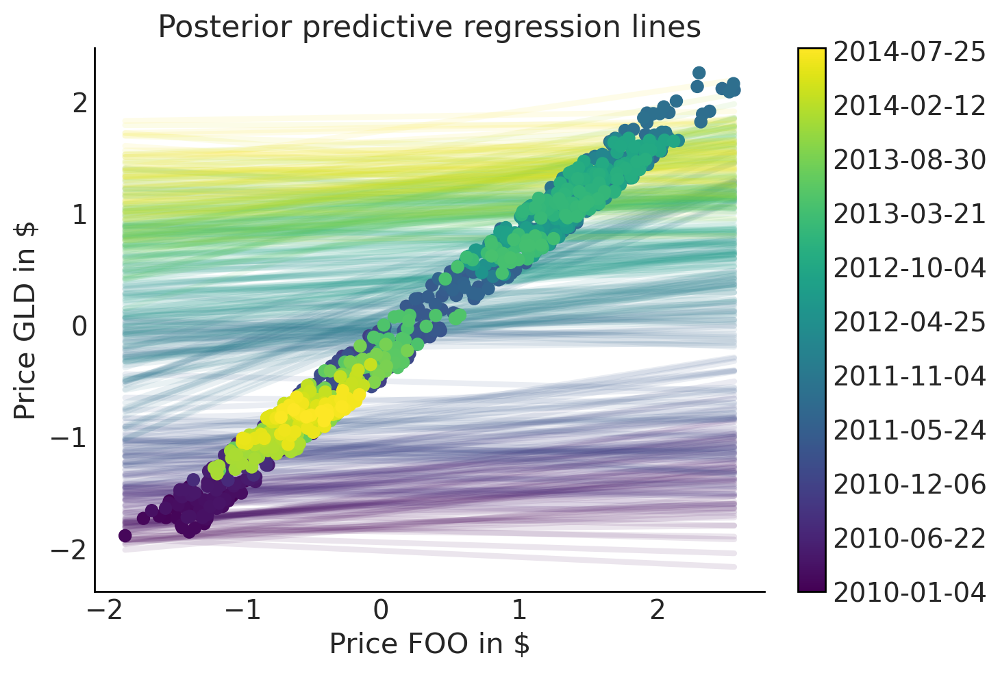

In [63]:
fig = plt.figure()
ax = fig.add_subplot(
    111,
    xlabel=r"Price FOO in \$",
    ylabel=r"Price GLD in \$",
    title="Posterior predictive regression lines",
)

colors = np.linspace(0, 1, len(prices))
colors_sc = np.linspace(0, 1, len(prices.index.values[::50]))

xi = xr.DataArray(np.linspace(data_with_foo.FOO.min(), data_with_foo.FOO.max(), 50))

for i, time in enumerate(prices.index.values[::50]):
    sel_trace = az.extract(idata_randomwalk_foo).sel(time=time)
    # regression_line = sel_trace["alpha"] + sel_trace["beta"] * xi
    regression_line = sel_trace["beta"][1] * xi + sel_trace["beta"][2]
    ax.plot(
        xi,
        regression_line.T[:, 0::200],
        color=mymap(colors_sc[i]),
        alpha=0.1,
        zorder=10,
        linewidth=3,
    )

sc = ax.scatter(
    data_with_foo.FOO, data_with_foo.GLD, label="data", cmap=mymap, c=colors, zorder=11
)

cb = plt.colorbar(sc, ticks=ticks)
cb.ax.set_yticklabels(ticklabels);

# Regression model explaining $\pi$ from recombination rate and density of constrained sites